In [45]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans
from collections import Counter
import os

In [46]:
img_paths = []

with open(r'img_paths.txt', 'r') as f:
    for line in f:
        img_paths.append(line[:-1])

In [47]:
def get_mean_color(values, colors):
    """
    Считаем среднее значение по всем базовым цветам в соответствии с весами
    Возвращает усредненный цвет в формате (R, G, B)
    
    :values: - веса цветов
    :colors: - цвета в формате RGB
    """
    
    np_values = np.reshape(np.array(list(values)), (len(values), 1))
    np_colors = np.array(colors)
    weights = np_values / np.sum(np_values)
    ans = weights*np_colors
    
    return np.sum(ans, axis=0)

def warm_or_cool(values, colors):
    """
    Определяет является ли цветовая гамма теплой или холодной
    
    :values: - веса цветов
    :colors: - цвета в формате RGB
    """
    
    mean_color = get_mean_color(values, colors)
    if mean_color[0] > mean_color[2] + 0.2*mean_color[1]:
        return 'warm'
    else:
        return 'cool'
    
    
def bright_or_dark(values, colors):
    """
    Определяет является ли цветовая гамма яркой или темной
    
    :values: - веса цветов
    :colors: - цвета в формате RGB
    """
    mean_color = get_mean_color(values, colors)
    if np.sum(mean_color) / 3 > 100:
        return 'bright'
    else:
        return 'dark'

In [48]:
def RGB_HEX(color):
    """
    Переводит RGB формат в HEX формат
    
    :color: - цвет в формате RGB
    """
    return "#{:02x}{:02x}{:02x}".format(int(color[0]), int(color[1]), int(color[2]))
    
    
def get_colors(image, number_of_colors, show_chart=True, node=2):
    """
    Считаем цветовую гамму для изображения
    Возвращает веса цветов, цвета в формате HEX, теплоту и яркость
    
    :image: - в формате np.ndarray, n_channels=3
    :number_of_colors: - сколько базовых цветов искать
    :show_chart: - отрисовывать ли полученную гамму
    :node: - параметр для отрисовки
    """
    
    clf = KMeans(n_clusters=number_of_colors, n_init='auto')
    reshaped_image = np.reshape(image, (image.shape[0]*image.shape[1], 3))
    labels = clf.fit_predict(reshaped_image)
    counts = Counter(labels)
    counts = dict(sorted(counts.items()))
    center_colors = clf.cluster_centers_
    rgb_colors = [center_colors[i] for i in counts.keys()]
    hex_colors = [RGB_HEX(rgb_colors[i]) for i in counts.keys()]
    
    warmness = warm_or_cool(counts.values(), rgb_colors)
    brightness = bright_or_dark(counts.values(), rgb_colors)
    
    if (show_chart):
        plt.subplot(1, 2, node)
        plt.pie(counts.values(), labels=hex_colors, colors=hex_colors)
        plt.title(warmness+' ' +brightness)
        
    return counts.values(), hex_colors, warmness, brightness

### Посчитаем цветовую гамму и сохраним ###

In [36]:
size = 13150
num_colors = 15

scores = np.zeros((size, num_colors), dtype=int)
hex_colors = np.empty((size, num_colors), dtype="<U20")
warmness = np.empty(size, dtype="<U10")
brightness = np.empty(size, dtype="<U10")

In [37]:
for j in range(0, size):
    pil_image = Image.open(img_paths[j])
    if pil_image != "RGB":
        pil_image = pil_image.convert(mode="RGB")
    np_image = np.asarray(pil_image)
    [value, hexc, w, b] = get_colors(np_image, 15, False)
    
    scores[j] = list(value)
    hex_colors[j] = hexc
    warmness[j] = w
    brightness[j] = b

In [42]:
np.save('scores', scores)
np.save('hex_colors', hex_colors)
np.save('warmness', warmness)
np.save('brightness', brightness)

# Примеры изображений #

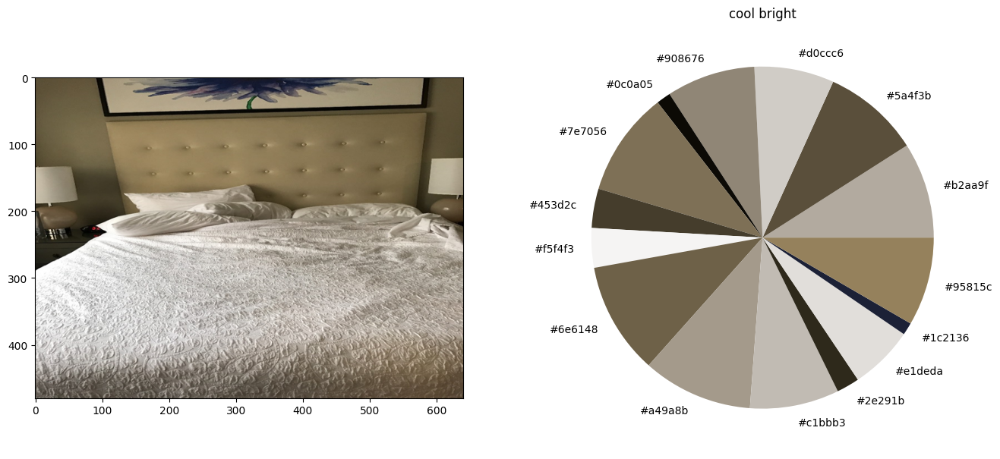

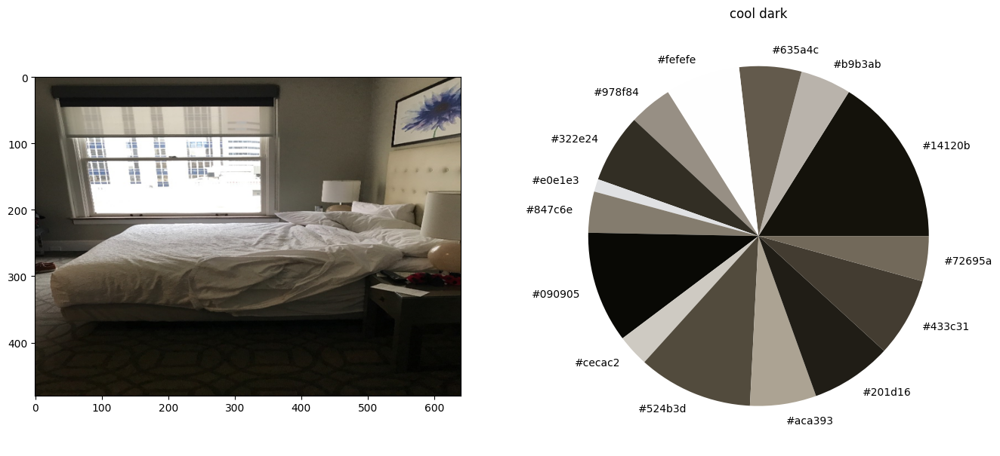

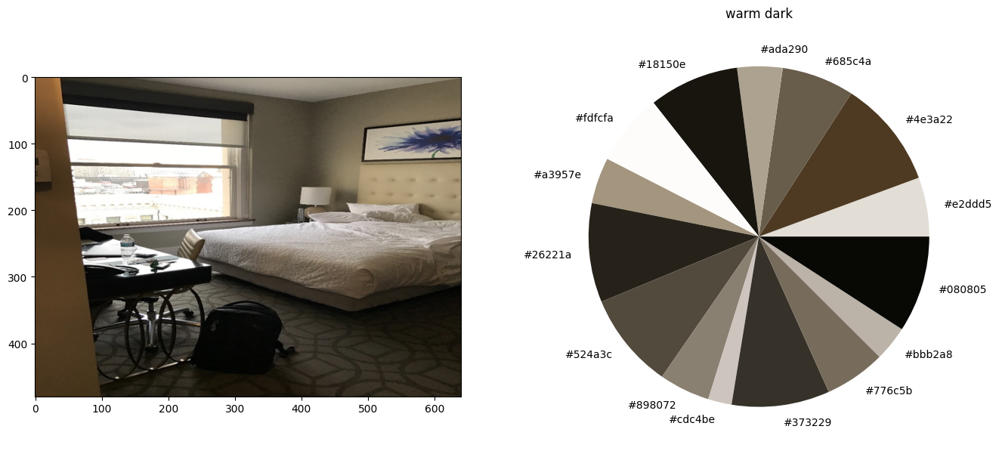

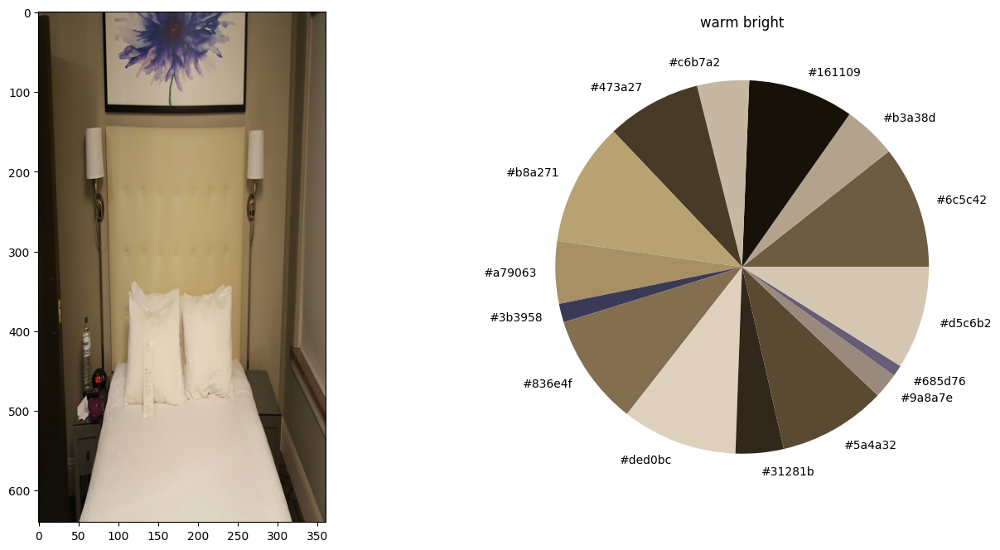

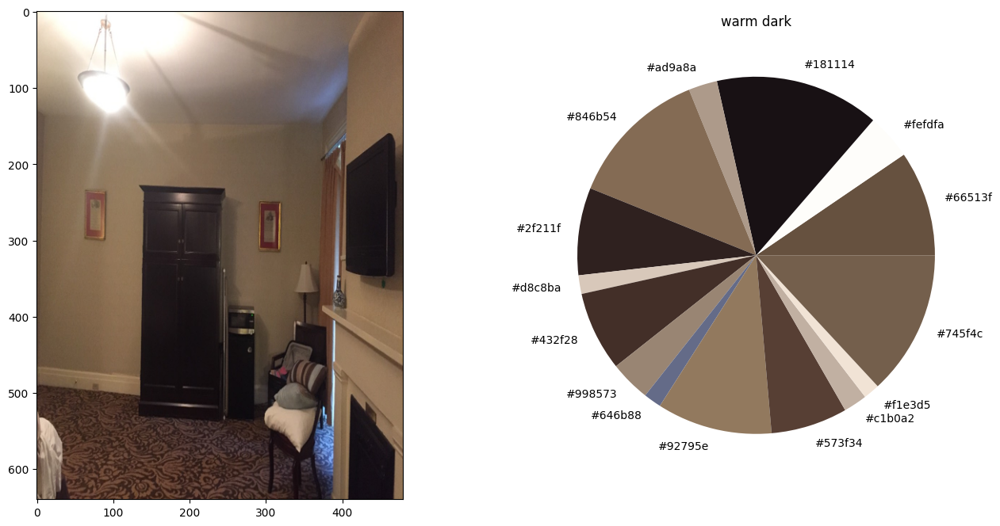

...

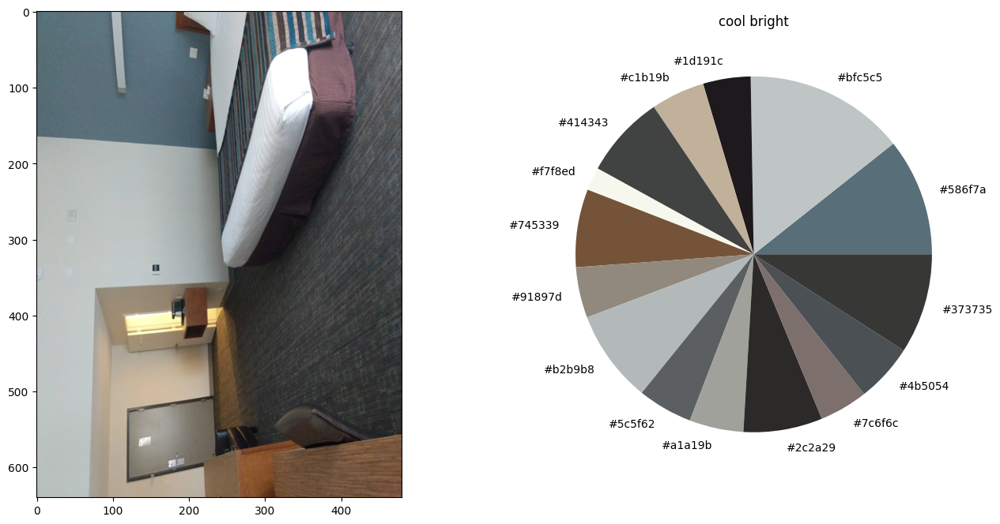

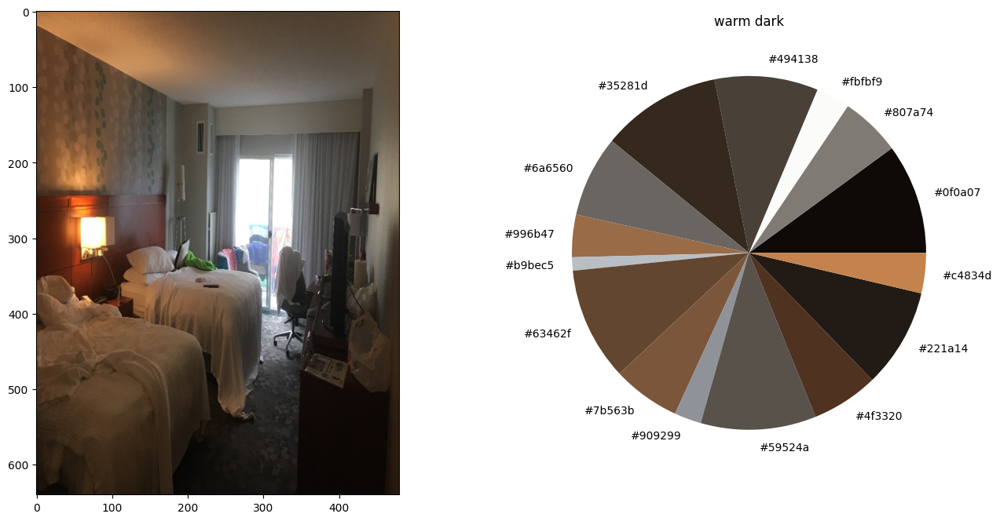

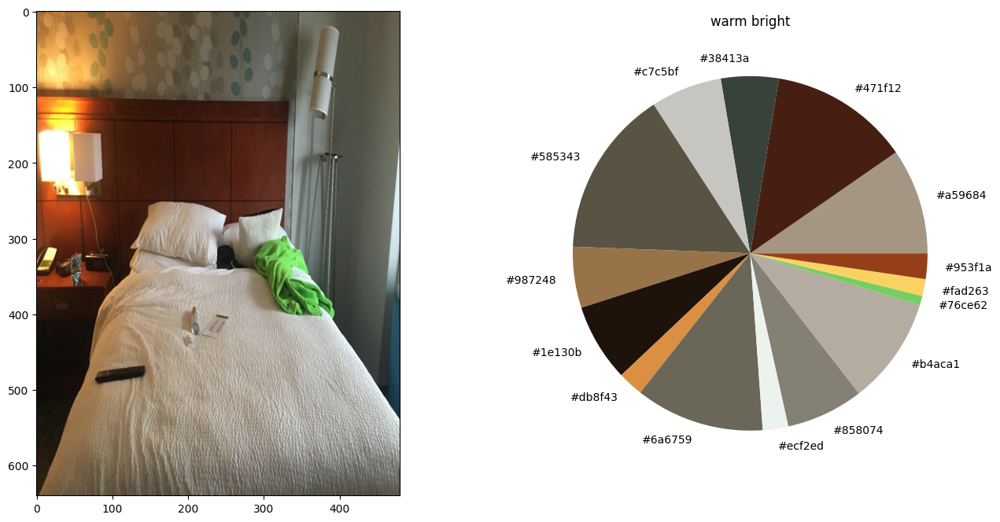

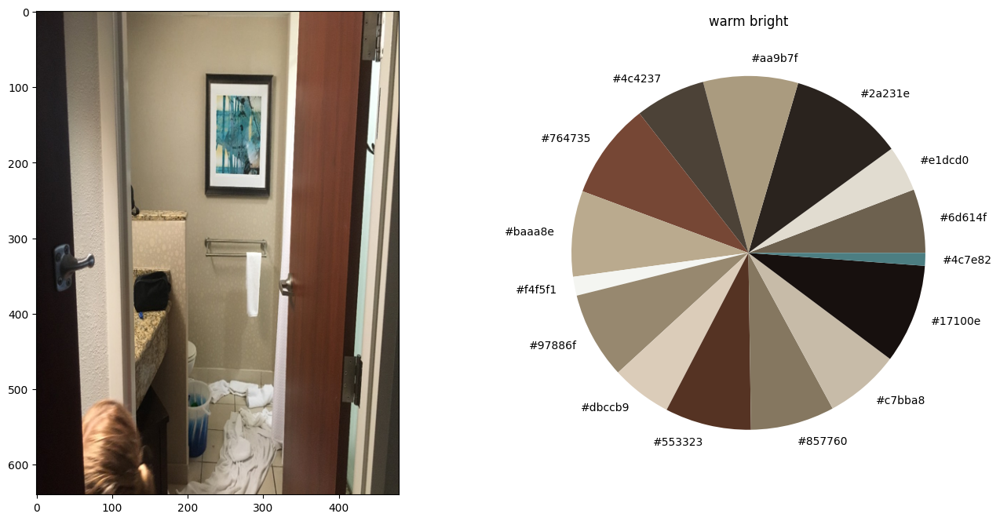

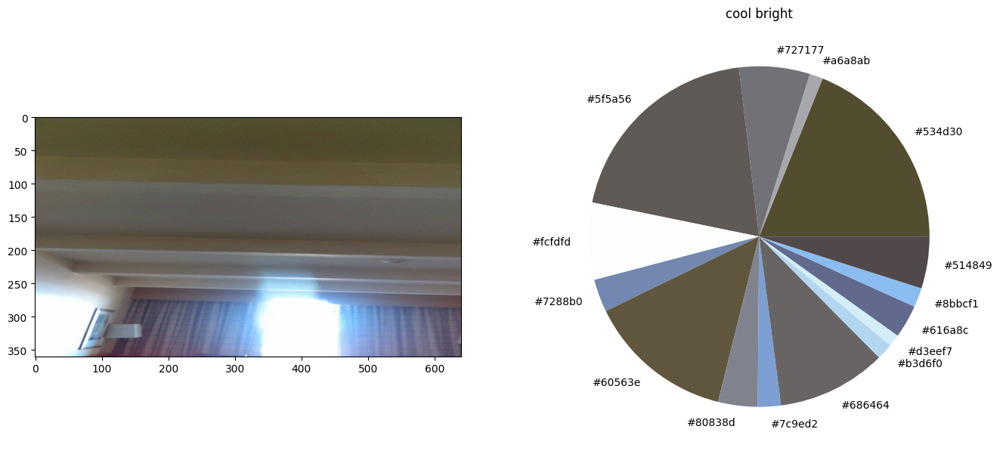

In [49]:
bs = 30

for j in range(0, bs):
    pil_image = Image.open(img_paths[bs+j])
    np_image = np.asarray(pil_image)
    plt.figure(figsize = (16, 8))
    plt.subplot(1, 2, 1)
    plt.imshow(np_image)
    get_colors(np_image, 15, True, node=2)
    plt.show()